In [ ]:
import torchvision.models
import torch
import numpy as np
import torch.utils.data
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim #for gradient descent
import matplotlib.pyplot as plt

import random
import math
import os
import requests

from PIL import Image
import torch
from torch import nn
from torchvision import transforms as T

import torch
from torch import nn

In [ ]:
from torchvision import datasets
import torchvision.transforms.v2
from torch.utils.data import DataLoader, Subset
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Load your dataset and preprocess it
transform_normal = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

transform_color = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.ColorJitter(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

transform_rotate = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.v2.RandomApply(transforms=[
        torchvision.transforms.RandomRotation(degrees=(90,90)),
        torchvision.transforms.RandomRotation(degrees=(180,180)),
        torchvision.transforms.RandomRotation(degrees=(270,270))], p=0.5),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

transform_rotate1 = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.RandomRotation(degrees=(90,90)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

transform_rotate2 = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.RandomRotation(degrees=(180,180)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

transform_rotate3 = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.RandomRotation(degrees=(270,270)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

transform_fliph = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

transform_flipv = torchvision.transforms.v2.Compose([
    torchvision.transforms.Resize((224, 224)),
    torchvision.transforms.RandomVerticalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[116.047 / 255, 113.753 / 255, 105.417 / 255], std=[1 / 255])
])

#transform_rotate = torchvision.transforms.v2.RandomApply(transforms=[transform_rotate1, transform_rotate2,transform_rotate3], p=1)

transform_list = [transform_normal, transform_color, transform_rotate1, transform_rotate2,transform_rotate3, transform_fliph, transform_flipv]

In [ ]:
# Prepare data directories and transformations
data_dir = '/content/gdrive/My Drive/APS360 Group Project/datax256_n_500/datax256_n_500'
train_dir = os.path.join(data_dir, 'train/')
val_dir = os.path.join(data_dir, 'val/')
test_dir = os.path.join(data_dir, 'test/')

train_datasets = []
val_datasets = []
test_datasets = []

for trans in transform_list:
    # Create datasets and dataloaders for training, validation, and test sets
    train_datasets.append(datasets.ImageFolder(train_dir, transform=trans))
    val_datasets.append(datasets.ImageFolder(val_dir, transform=trans))
    test_datasets.append(datasets.ImageFolder(test_dir, transform=trans))

from torch.utils.data import ConcatDataset
train_dataset = ConcatDataset(train_datasets)
val_dataset = ConcatDataset(val_datasets)
test_dataset = ConcatDataset(test_datasets)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

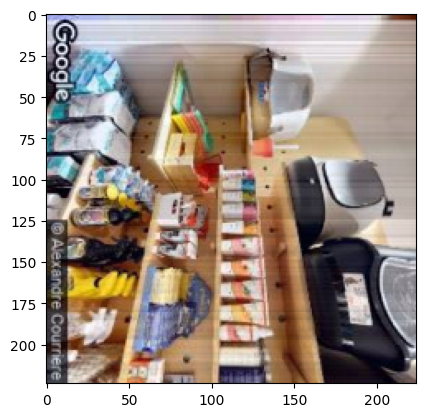

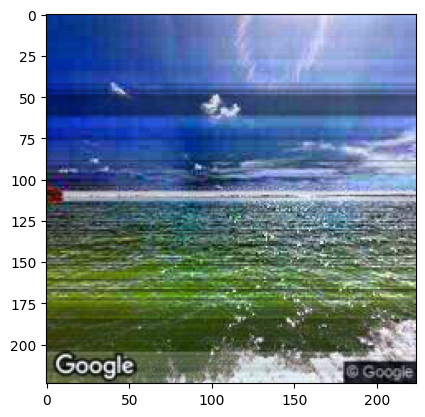

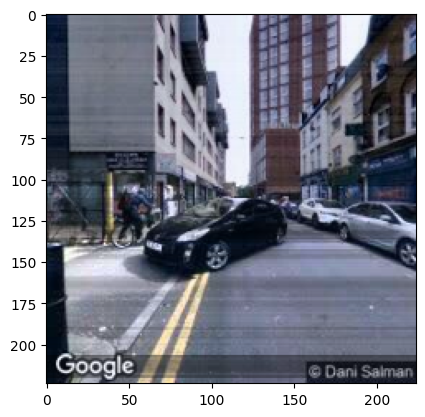

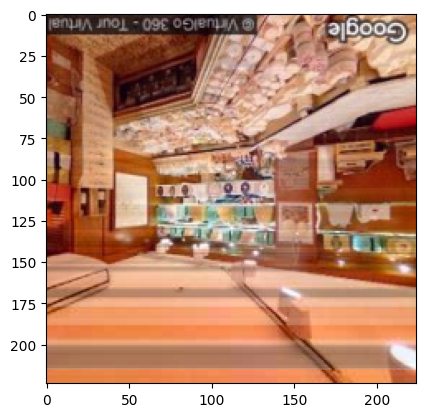

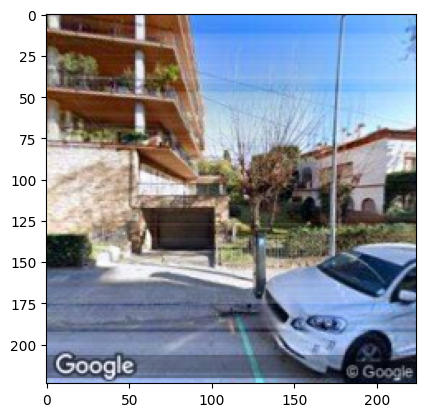

...

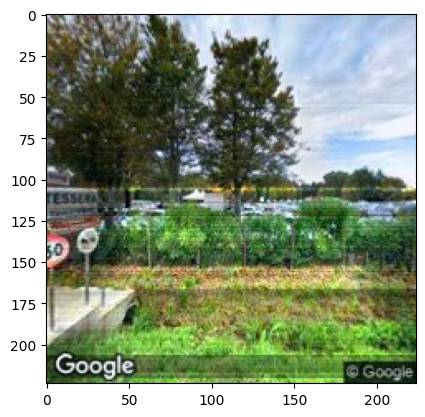

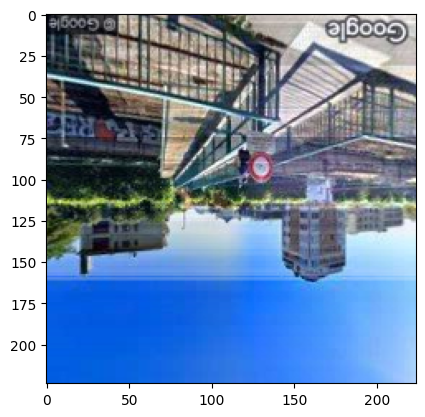

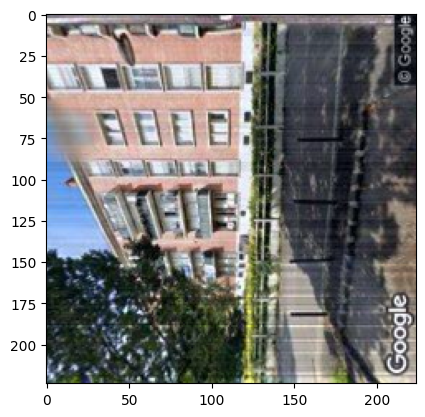

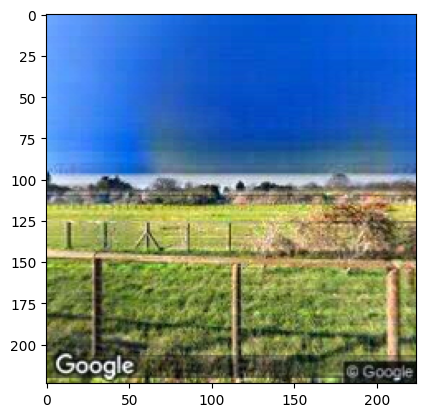

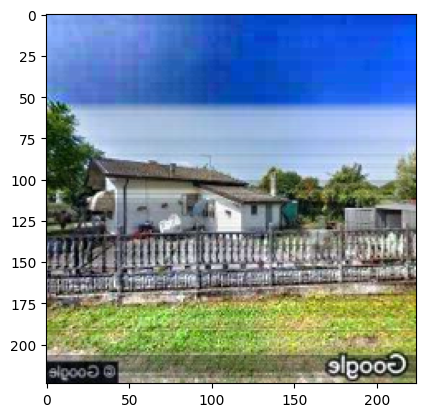

In [ ]:
import matplotlib.pyplot as plt

for inputs, label in train_loader:
    for img in inputs:
        image  = img.cpu().numpy()
        # transpose image to fit plt input
        image  = img.cpu().permute(1,2,0).numpy()
        # normalise image
        data_min = np.min(image, axis=(1,2), keepdims=True)
        data_max = np.max(image, axis=(1,2), keepdims=True)
        scaled_data = (image - data_min) / (data_max - data_min)
        # show image
        plt.imshow(scaled_data)
        plt.show()
    break